# Refer-KITTI Ground Truth and Prediction Visualization

This notebook visualizes:
1. Ground truth annotations for random samples from Refer-KITTI dataset
2. Model predictions vs ground truth comparison

We'll verify that the evaluation pipeline is working correctly by inspecting the data.

In [19]:
import os
import sys
import json
import random
import glob as _glob
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import hsv_to_rgb
import pandas as pd
  
# Add parent directory to path
sys.path.insert(0, os.path.abspath('..'))
sys.path.insert(0, os.path.abspath('.'))

%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 10)

## Configuration

In [20]:
# Dataset paths
DATA_ROOT = "dataset/referkitti"  # Update this path as needed
KITTI_SPLIT = "training"

# Paths to data
IMAGES_ROOT = os.path.join(DATA_ROOT, "KITTI", KITTI_SPLIT, "image_02")
LABELS_ROOT = os.path.join(DATA_ROOT, "KITTI", KITTI_SPLIT, "labels_with_ids", "image_02")
EXPRESSION_ROOT = os.path.join(DATA_ROOT, "expression")

# Number of random samples to visualize
NUM_SAMPLES = 10

print(f"Images root: {IMAGES_ROOT}")
print(f"Labels root: {LABELS_ROOT}")
print(f"Expression root: {EXPRESSION_ROOT}")

Images root: dataset/referkitti/KITTI/training/image_02
Labels root: dataset/referkitti/KITTI/training/labels_with_ids/image_02
Expression root: dataset/referkitti/expression


## Utility Functions

## 📖 Understanding the Bbox Coordinate System

### Where the plotting happens:

The bounding box visualization happens in the **`visualize_frame_with_gt()`** function. Here's the workflow:

1. **Load labels** using `load_frame_labels()`:
   - Reads YOLO-format labels from `.txt` files
   - Format: `class_id track_id x_center y_center width height`
   - **All coordinates are normalized (0-1 range)**

2. **Load image** and get dimensions:
   - Reads the image using OpenCV
   - Extracts `H` (height) and `W` (width) in pixels

3. **Convert coordinates** from normalized to pixel space:
   ```python
   x_c = x_center_normalized * W     # center X in pixels
   y_c = y_center_normalized * H     # center Y in pixels
   bw = width_normalized * W         # width in pixels
   bh = height_normalized * H        # height in pixels
   ```

4. **Convert from center-based to corner-based**:
   ```python
   x1 = x_c - bw / 2.0    # top-left X
   y1 = y_c - bh / 2.0    # top-left Y
   ```

5. **Draw rectangle** using matplotlib:
   ```python
   rect = patches.Rectangle((x1, y1), bw, bh, ...)
   ```

### Common issues with "weird boxes":

- **Boxes too large/small**: Coordinate values might not be normalized (0-1)
- **Boxes in wrong position**: Might be using corner coords instead of center coords
- **Boxes outside image**: Negative values or values > 1 in normalized coords
- **Aspect ratio wrong**: Width/Height might be swapped

### Debugging approach:

1. Run the debug cells below to print raw bbox values
2. Check if normalized coordinates are in [0, 1] range
3. Verify pixel coordinates match image dimensions
4. Compare visual output with printed coordinates

In [ ]:
def load_expressions_for_sequence(expr_root: str, seq: str):
    """
    Load all referring expressions for a sequence.
    Returns a list of dicts: { "expr_id": int, "text": str, "obj_ids": List[int] }
    """
    seq_dir = os.path.join(expr_root, seq)
    json_paths = []
    
    if os.path.isdir(seq_dir):
        json_paths = sorted(_glob.glob(os.path.join(seq_dir, "*.json")))
    
    single_path = os.path.join(expr_root, f"{seq}.json")
    if os.path.isfile(single_path):
        json_paths.append(single_path)
    
    if not json_paths:
        return []
    
    result = []
    expr_counter = 0
    
    for jp in json_paths:
        with open(jp, "r") as f:
            data = json.load(f)
        
        # Refer-KITTI style (label + sentence)
        if isinstance(data, dict) and "sentence" in data and "label" in data:
            text = data["sentence"]
            label_map = {int(k): v for k, v in data.get("label", {}).items()}
            
            id_set = set()
            for frame_id, ids in label_map.items():
                if isinstance(ids, (int, str)):
                    id_set.add(int(ids))
                else:
                    for tid in ids:
                        id_set.add(int(tid))
            
            if id_set:
                result.append({
                    "expr_id": expr_counter,
                    "text": text,
                    "obj_ids": sorted(id_set),
                    "label_map": label_map,
                    "json_file": jp
                })
                expr_counter += 1
    
    return result


def load_frame_labels(labels_root, seq, frame_id):
    """
    Load YOLO-style labels for a specific frame.
    Returns: list of dicts with keys: class_id, track_id, x_center, y_center, width, height (all normalized)
    """
    label_path = os.path.join(labels_root, seq, f"{frame_id:06d}.txt")
    
    if not os.path.isfile(label_path):
        return []
    
    labels = []
    with open(label_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            
            parts = line.split()
            if len(parts) < 6:
                continue
            
            try:
                class_id = int(parts[0])
                track_id = int(float(parts[1]))
                x_c = float(parts[2])
                y_c = float(parts[3])
                w = float(parts[4])
                h = float(parts[5])
                
                labels.append({
                    "class_id": class_id,
                    "track_id": track_id,
                    "x_center": x_c,
                    "y_center": y_c,
                    "width": w,
                    "height": h
                })
            except ValueError:
                continue
    
    return labels


def get_color_for_id(track_id, num_colors=20):
    """
    Generate a distinct color for each track ID using HSV color space.
    """
    hue = (track_id * 0.618033988749895) % 1.0  # Golden ratio for better distribution
    saturation = 0.9
    value = 0.9
    rgb = hsv_to_rgb([hue, saturation, value])
    return rgb


def visualize_frame_with_gt(images_root, labels_root, seq, frame_id, target_ids=None, title=""):
    """
    Visualize a frame with ground truth bounding boxes.
    
    Args:
        target_ids: If provided, highlight only these track IDs
    """
    # Load image
    img_path_png = os.path.join(images_root, seq, f"{frame_id:06d}.png")
    img_path_jpg = os.path.join(images_root, seq, f"{frame_id:06d}.jpg")
    
    img = cv2.imread(img_path_png)
    if img is None:
        img = cv2.imread(img_path_jpg)
    
    if img is None:
        print(f"Could not load image: {img_path_png} or {img_path_jpg}")
        return
    
    # Convert BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    
    # Load labels
    labels = load_frame_labels(labels_root, seq, frame_id)
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    ax.imshow(img)
    
    # Draw bounding boxes
    for label in labels:
        track_id = label["track_id"]
        
        # Skip if we have target_ids and this is not one of them
        if target_ids is not None and track_id not in target_ids:
            continue
        
        # Convert normalized to pixel coordinates
        x_c = label["x_center"] * W
        y_c = label["y_center"] * H
        bw = label["width"] * W
        bh = label["height"] * H
        
        x1 = x_c - bw / 2.0
        y1 = y_c - bh / 2.0
        
        # Get color for this track
        color = get_color_for_id(track_id)
        
        # Draw bounding box
        rect = patches.Rectangle(
            (x1, y1), bw, bh,
            linewidth=3,
            edgecolor=color,
            facecolor='none'
        )
        ax.add_patch(rect)
        
        # Add label
        is_target = target_ids is not None and track_id in target_ids
        label_text = f"ID:{track_id}"
        if is_target:
            label_text = f"⭐ {label_text}"
        
        ax.text(
            x1, y1 - 5,
            label_text,
            color='white',
            fontsize=12,
            bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
        )
    
    ax.axis('off')
    
    if title:
        ax.set_title(title, fontsize=14, pad=10)
    
    plt.tight_layout()
    plt.show()

print("Utility functions loaded!")

Utility functions loaded!


## Part 1: Sample Random Expressions and Visualize Ground Truth

In [22]:
# Collect all available sequences
if not os.path.isdir(IMAGES_ROOT):
    print(f"ERROR: Images root not found: {IMAGES_ROOT}")
    print("Please update DATA_ROOT in the configuration cell above.")
else:
    all_seqs = sorted([
        d for d in os.listdir(IMAGES_ROOT)
        if os.path.isdir(os.path.join(IMAGES_ROOT, d))
    ])
    
    print(f"Found {len(all_seqs)} sequences in dataset")
    print(f"Sequences: {all_seqs[:10]}..." if len(all_seqs) > 10 else f"Sequences: {all_seqs}")

Found 15 sequences in dataset
Sequences: ['0000', '0001', '0002', '0003', '0004', '0005', '0006', '0007', '0008', '0009']...


In [23]:
# Collect all expressions across all sequences
all_expressions = []

for seq in all_seqs:
    expr_list = load_expressions_for_sequence(EXPRESSION_ROOT, seq)
    for expr in expr_list:
        expr["seq"] = seq
        all_expressions.append(expr)

print(f"Total expressions found: {len(all_expressions)}")

# Show a few examples
if all_expressions:
    print("\nExample expressions:")
    for i, expr in enumerate(all_expressions[:5]):
        print(f"  {i+1}. Seq {expr['seq']}, Expr {expr['expr_id']}: '{expr['text']}'")
        print(f"     Target IDs: {expr['obj_ids']}")

Total expressions found: 691

Example expressions:
  1. Seq 0001, Expr 0: 'black cars in right'
     Target IDs: [9, 11, 36, 38, 39, 41, 45, 54, 57, 58, 59, 84, 85]
  2. Seq 0001, Expr 1: 'black cars in the left'
     Target IDs: [4, 5, 14, 15, 19, 24, 25, 31, 43, 46, 49, 51, 59, 72, 76, 82, 93, 94]
  3. Seq 0001, Expr 2: 'black vehicles in right'
     Target IDs: [9, 11, 36, 38, 39, 41, 45, 54, 57, 58, 59, 84, 85]
  4. Seq 0001, Expr 3: 'black vehicles in the left'
     Target IDs: [4, 5, 14, 15, 19, 24, 25, 31, 43, 46, 49, 51, 59, 72, 76, 82, 93, 94]
  5. Seq 0001, Expr 4: 'cars in black'
     Target IDs: [4, 5, 9, 11, 14, 15, 19, 24, 25, 31, 36, 38, 39, 41, 43, 45, 46, 49, 51, 54, 57, 58, 59, 72, 76, 82, 84, 85, 93, 94]


In [24]:
# Sample random expressions
if len(all_expressions) == 0:
    print("No expressions found! Check your data paths.")
else:
    num_to_sample = min(NUM_SAMPLES, len(all_expressions))
    sampled_expressions = random.sample(all_expressions, num_to_sample)
    
    print(f"Sampled {num_to_sample} random expressions for visualization")

Sampled 10 random expressions for visualization


## DEBUG: Print Raw Bbox Values

Let me add a debugging cell to inspect the raw bbox data before plotting.

Testing visualization for:
  Sequence: 0009
  Frame: 000000
  Expression: 'cars in right'
  Target IDs: [1, 2, 3, 5, 6, 8, 9, 12, 13, 14, 25, 26, 27, 29, 30, 31, 33, 38, 39, 40, 41, 43, 45, 46, 50, 51, 57, 58, 59, 60, 61, 63, 65, 67, 70, 73, 107]

🔍 Plotting Frame Debug Info:
   Image dimensions: W=1242, H=375
   Number of objects: 2
   Target IDs to highlight: {1, 2, 3, 5, 6, 8, 9, 12, 13, 14, 25, 26, 27, 29, 30, 31, 33, 38, 39, 40, 41, 43, 45, 46, 50, 51, 57, 58, 59, 60, 61, 63, 65, 67, 70, 73, 107}

   Object 2 (ID 12):
      Normalized: center=(0.4767, 0.4667), size=(0.0580×0.0693)
      Pixel:      center=(592.0, 175.0), size=(72.0×26.0)
      Rectangle:  top-left=(556.0, 162.0), bottom-right=(628.0, 188.0)


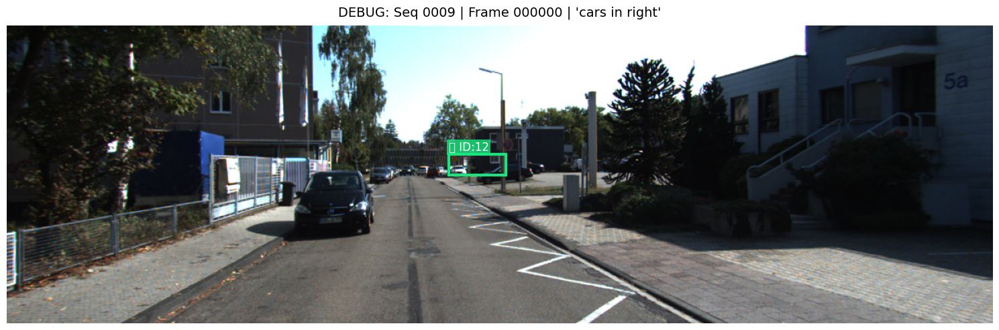

In [25]:
# Use the debug visualization on the first sampled expression
if sampled_expressions:
    test_expr = sampled_expressions[0]
    test_seq = test_expr["seq"]
    test_text = test_expr["text"]
    test_obj_ids = test_expr["obj_ids"]
    test_label_map = test_expr.get("label_map", {})
    
    # Find a frame
    test_frame_ids = [int(f) for f in test_label_map.keys()] if test_label_map else []
    
    if not test_frame_ids:
        seq_labels_dir = os.path.join(LABELS_ROOT, test_seq)
        if os.path.isdir(seq_labels_dir):
            label_files = sorted([f for f in os.listdir(seq_labels_dir) if f.endswith('.txt')])
            for label_file in label_files[:50]:
                try:
                    frame_id = int(os.path.splitext(label_file)[0])
                    labels = load_frame_labels(LABELS_ROOT, test_seq, frame_id)
                    track_ids = [l['track_id'] for l in labels]
                    if any(tid in test_obj_ids for tid in track_ids):
                        test_frame_ids.append(frame_id)
                except ValueError:
                    continue
    
    if test_frame_ids:
        test_frame = test_frame_ids[0]
        
        print(f"Testing visualization for:")
        print(f"  Sequence: {test_seq}")
        print(f"  Frame: {test_frame:06d}")
        print(f"  Expression: '{test_text}'")
        print(f"  Target IDs: {test_obj_ids}")
        
        title = f"DEBUG: Seq {test_seq} | Frame {test_frame:06d} | '{test_text}'"
        
        # Call the debug visualization (will print coordinate transformations)
        visualize_frame_with_gt_debug(
            IMAGES_ROOT, LABELS_ROOT, test_seq, test_frame,
            target_ids=set(test_obj_ids),
            title=title,
            verbose=True  # Enable detailed output
        )
    else:
        print("No frames found for testing")
else:
    print("No expressions to test")

## Test Debug Visualization

Now let's use the debug function to see exactly what's happening with the coordinate transformations:

In [ ]:
def visualize_frame_with_gt_debug(images_root, labels_root, seq, frame_id, target_ids=None, title="", verbose=True):
    """
    Visualize a frame with ground truth bounding boxes WITH DEBUG OUTPUT.
    
    This function is identical to visualize_frame_with_gt but prints detailed
    coordinate transformation information to help debug bbox issues.
    """
    # Load image
    img_path_png = os.path.join(images_root, seq, f"{frame_id:06d}.png")
    img_path_jpg = os.path.join(images_root, seq, f"{frame_id:06d}.jpg")
    
    img = cv2.imread(img_path_png)
    if img is None:
        img = cv2.imread(img_path_jpg)
    
    if img is None:
        print(f"Could not load image: {img_path_png} or {img_path_jpg}")
        return
    
    # Convert BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    
    if verbose:
        print(f"\n🔍 Plotting Frame Debug Info:")
        print(f"   Image dimensions: W={W}, H={H}")
    
    # Load labels
    labels = load_frame_labels(labels_root, seq, frame_id)
    
    if verbose:
        print(f"   Number of objects: {len(labels)}")
        print(f"   Target IDs to highlight: {target_ids if target_ids else 'All'}\n")
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    ax.imshow(img)
    
    # Draw bounding boxes
    for idx, label in enumerate(labels):
        track_id = label["track_id"]
        
        # Skip if we have target_ids and this is not one of them
        if target_ids is not None and track_id not in target_ids:
            continue
        
        # YOLO format: normalized coordinates (0-1)
        x_c_norm = label["x_center"]
        y_c_norm = label["y_center"]
        w_norm = label["width"]
        h_norm = label["height"]
        
        # Convert normalized to pixel coordinates
        x_c = x_c_norm * W  # center x in pixels
        y_c = y_c_norm * H  # center y in pixels
        bw = w_norm * W     # width in pixels
        bh = h_norm * H     # height in pixels
        
        # Convert center+size to top-left corner
        x1 = x_c - bw / 2.0
        y1 = y_c - bh / 2.0
        
        if verbose:
            print(f"   Object {idx+1} (ID {track_id}):")
            print(f"      Normalized: center=({x_c_norm:.4f}, {y_c_norm:.4f}), size=({w_norm:.4f}×{h_norm:.4f})")
            print(f"      Pixel:      center=({x_c:.1f}, {y_c:.1f}), size=({bw:.1f}×{bh:.1f})")
            print(f"      Rectangle:  top-left=({x1:.1f}, {y1:.1f}), bottom-right=({x1+bw:.1f}, {y1+bh:.1f})")
        
        # Get color for this track
        color = get_color_for_id(track_id)
        
        # Draw bounding box using matplotlib Rectangle
        # Rectangle(xy, width, height) where xy is bottom-left corner
        rect = patches.Rectangle(
            (x1, y1), bw, bh,
            linewidth=3,
            edgecolor=color,
            facecolor='none'
        )
        ax.add_patch(rect)
        
        # Add label
        is_target = target_ids is not None and track_id in target_ids
        label_text = f"ID:{track_id}"
        if is_target:
            label_text = f"⭐ {label_text}"
        
        ax.text(
            x1, y1 - 5,
            label_text,
            color='white',
            fontsize=12,
            bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
        )
    
    ax.axis('off')
    
    if title:
        ax.set_title(title, fontsize=14, pad=10)
    
    plt.tight_layout()
    plt.show()

print("Debug visualization function loaded!")

Debug visualization function loaded!


In [ ]:
# DEBUG: Inspect a single frame's raw bbox data
# Pick first expression for debugging
if sampled_expressions:
    debug_expr = sampled_expressions[0]
    debug_seq = debug_expr["seq"]
    debug_obj_ids = debug_expr["obj_ids"]
    debug_label_map = debug_expr.get("label_map", {})
    
    # Find a frame with target objects
    debug_frame_ids = list(debug_label_map.keys())  # they are already ints now
    
    if not debug_frame_ids:
        # Fallback search
        seq_labels_dir = os.path.join(LABELS_ROOT, debug_seq)
        if os.path.isdir(seq_labels_dir):
            label_files = sorted([f for f in os.listdir(seq_labels_dir) if f.endswith('.txt')])
            for label_file in label_files[:50]:
                try:
                    frame_id = int(os.path.splitext(label_file)[0])
                    labels = load_frame_labels(LABELS_ROOT, debug_seq, frame_id)
                    track_ids = [l['track_id'] for l in labels]
                    if any(tid in debug_obj_ids for tid in track_ids):
                        debug_frame_ids.append(frame_id)
                except ValueError:
                    continue
    
    if debug_frame_ids:
        debug_frame = debug_frame_ids[0]
        
        # Load image to get dimensions
        img_path_png = os.path.join(IMAGES_ROOT, debug_seq, f"{debug_frame:06d}.png")
        img_path_jpg = os.path.join(IMAGES_ROOT, debug_seq, f"{debug_frame:06d}.jpg")
        
        img = cv2.imread(img_path_png)
        if img is None:
            img = cv2.imread(img_path_jpg)
        
        if img is not None:
            H, W = img.shape[:2]
            
            print(f"DEBUG INFO for Sequence {debug_seq}, Frame {debug_frame:06d}")
            print(f"Image dimensions: W={W}, H={H}")
            print(f"Expression: '{debug_expr['text']}'")
            print(f"Target IDs: {debug_obj_ids}")
            print(f"\n{'='*100}")
            print(f"{'Track ID':<10} {'Normalized (x_c, y_c, w, h)':<40} {'Pixel (x1, y1, x2, y2)':<40} {'Is Target'}")
            print(f"{'='*100}")
            
            # Load and print all labels
            labels = load_frame_labels(LABELS_ROOT, debug_seq, debug_frame)
            
            for label in labels:
                track_id = label["track_id"]
                
                # Normalized values
                x_c_norm = label["x_center"]
                y_c_norm = label["y_center"]
                w_norm = label["width"]
                h_norm = label["height"]
                
                # Convert to pixel coordinates
                x_c = x_c_norm * W
                y_c = y_c_norm * H
                bw = w_norm * W
                bh = h_norm * H
                
                # Top-left corner
                x1 = x_c - bw / 2.0
                y1 = y_c - bh / 2.0
                
                # Bottom-right corner
                x2 = x1 + bw
                y2 = y1 + bh
                
                is_target = "⭐ YES" if track_id in debug_obj_ids else "no"
                
                norm_str = f"({x_c_norm:.4f}, {y_c_norm:.4f}, {w_norm:.4f}, {h_norm:.4f})"
                pixel_str = f"({x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f})"
                
                print(f"{track_id:<10} {norm_str:<40} {pixel_str:<40} {is_target}")
            
            print(f"{'='*100}\n")
            
            # Also print raw label file content
            label_file_path = os.path.join(LABELS_ROOT, debug_seq, f"{debug_frame:06d}.txt")
            print(f"Raw label file content ({label_file_path}):")
            print("-" * 80)
            with open(label_file_path, 'r') as f:
                content = f.read()
                print(content)
            print("-" * 80)
        else:
            print(f"Could not load debug image")
    else:
        print("No frames with target objects found for debugging")
else:
    print("No expressions to debug")

DEBUG INFO for Sequence 0009, Frame 000000
Image dimensions: W=1242, H=375
Expression: 'cars in right'
Target IDs: [1, 2, 3, 5, 6, 8, 9, 12, 13, 14, 25, 26, 27, 29, 30, 31, 33, 38, 39, 40, 41, 43, 45, 46, 50, 51, 57, 58, 59, 60, 61, 63, 65, 67, 70, 73, 107]

Track ID   Normalized (x_c, y_c, w, h)              Pixel (x1, y1, x2, y2)                   Is Target
11         (0.2907, 0.4853, 0.0829, 0.2187)         (309.5, 141.0, 412.5, 223.0)             no
12         (0.4767, 0.4667, 0.0580, 0.0693)         (556.0, 162.0, 628.0, 188.0)             ⭐ YES

Raw label file content (dataset/referkitti/KITTI/training/labels_with_ids/image_02/0009/000000.txt):
--------------------------------------------------------------------------------
0 11 0.290660 0.485333 0.082931 0.218667
0 12 0.476651 0.466667 0.057971 0.069333

--------------------------------------------------------------------------------


In [ ]:
# Test coordinate conversion on sequence 0010, frame 62 (from your example)
test_seq = "0010"
test_frame = 62

# Load image
img_path_png = os.path.join(IMAGES_ROOT, test_seq, f"{test_frame:06d}.png")
img_path_jpg = os.path.join(IMAGES_ROOT, test_seq, f"{test_frame:06d}.jpg")

img = cv2.imread(img_path_png)
if img is None:
    img = cv2.imread(img_path_jpg)

if img is not None:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    
    print(f"Testing Sequence {test_seq}, Frame {test_frame:06d}")
    print(f"Image dimensions: W={W}, H={H}\n")
    
    # Load YOLO labels
    labels = load_frame_labels(LABELS_ROOT, test_seq, test_frame)
    
    print("YOLO Format → Pixel Coordinate Conversion:")
    print("=" * 120)
    print(f"{'Track':<8} {'YOLO (norm)':<45} {'Pixel (center)':<25} {'Pixel (top-left corner)':<30} {'Pixel (bbox)':<30}")
    print("=" * 120)
    
    for label in labels:
        tid = label["track_id"]
        x_c_norm = label["x_center"]
        y_c_norm = label["y_center"]
        w_norm = label["width"]
        h_norm = label["height"]
        
        # Convert to pixels
        x_c_px = x_c_norm * W
        y_c_px = y_c_norm * H
        w_px = w_norm * W
        h_px = h_norm * H
        
        # Top-left corner
        x1 = x_c_px - w_px / 2.0
        y1 = y_c_px - h_px / 2.0
        
        # Bottom-right corner
        x2 = x1 + w_px
        y2 = y1 + h_px
        
        yolo_str = f"({x_c_norm:.4f}, {y_c_norm:.4f}, {w_norm:.4f}, {h_norm:.4f})"
        center_str = f"({x_c_px:.1f}, {y_c_px:.1f})"
        corner_str = f"({x1:.1f}, {y1:.1f})"
        bbox_str = f"[{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]"
        
        print(f"ID {tid:<5} {yolo_str:<45} {center_str:<25} {corner_str:<30} {bbox_str:<30}")
    
    print("=" * 120)
    
    # Visualize with pixel coordinates annotated
    fig, ax = plt.subplots(1, 1, figsize=(16, 10))
    ax.imshow(img_rgb)
    
    for label in labels:
        tid = label["track_id"]
        x_c = label["x_center"] * W
        y_c = label["y_center"] * H
        bw = label["width"] * W
        bh = label["height"] * H
        
        x1 = x_c - bw / 2.0
        y1 = y_c - bh / 2.0
        x2 = x1 + bw
        y2 = y1 + bh
        
        # Draw box
        color = get_color_for_id(tid)
        rect = patches.Rectangle((x1, y1), bw, bh, linewidth=3, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        
        # Add track ID label
        ax.text(x1, y1 - 10, f"ID:{tid}", color='white', fontsize=11, fontweight='bold',
               bbox=dict(facecolor=color, alpha=0.9, edgecolor='none', pad=3))
        
        # Add corner coordinates
        ax.text(x1, y2 + 15, f"({x1:.0f},{y1:.0f})", color=color, fontsize=8,
               bbox=dict(facecolor='white', alpha=0.7, edgecolor=color, pad=1))
        
        # Draw center point
        ax.plot(x_c, y_c, 'o', color=color, markersize=5)
        ax.text(x_c + 5, y_c, f"center", color=color, fontsize=8,
               bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
    
    ax.set_title(f"Coordinate Verification: Seq {test_seq}, Frame {test_frame:06d} | Image size: {W}×{H}", 
                fontsize=14, fontweight='bold')
    ax.axis('off')
    
    # Add grid for easier verification
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n✅ Visual check: Do the boxes align correctly with the objects in the image?")
    print(f"   If boxes appear shifted, the coordinate format might be different than YOLO.")
else:
    print(f"Could not load test image")

## 🔍 COORDINATE VERIFICATION TEST

Let's manually verify the coordinate conversion is correct by showing exact pixel values:


Sample 1/10
Sequence: 0009
Expression: 'cars in right'
Target Object IDs: [1, 2, 3, 5, 6, 8, 9, 12, 13, 14, 25, 26, 27, 29, 30, 31, 33, 38, 39, 40, 41, 43, 45, 46, 50, 51, 57, 58, 59, 60, 61, 63, 65, 67, 70, 73, 107]
JSON file: dataset/referkitti/expression/0009/cars-in-right.json


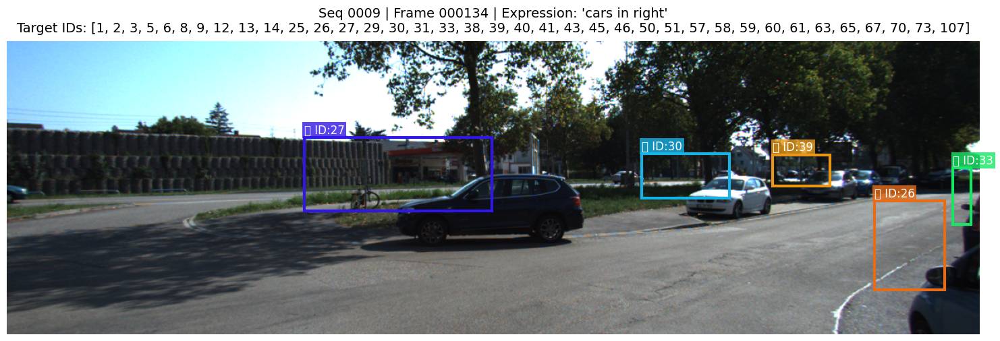


Sample 2/10
Sequence: 0008
Expression: 'vehicles in black'
Target Object IDs: [2, 4, 7, 11, 21, 22, 24, 36, 37, 98]
JSON file: dataset/referkitti/expression/0008/vehicles-in-black.json


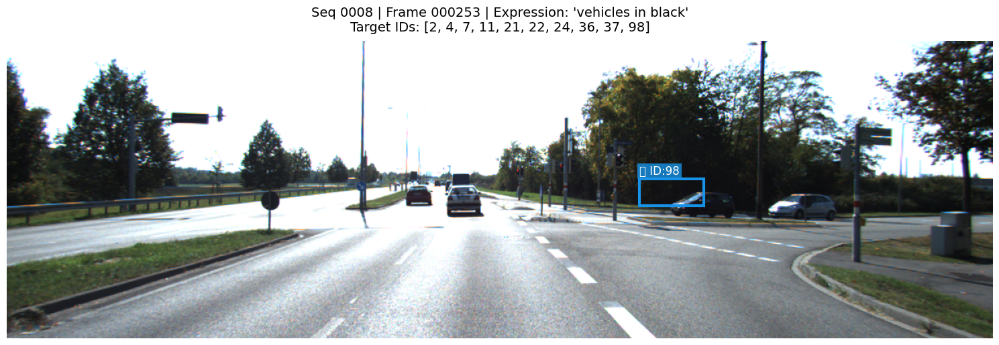


Sample 3/10
Sequence: 0011
Expression: 'left cars in the counter direction of ours'
Target Object IDs: [3, 4, 5, 6, 8, 29, 31, 34, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 59, 60, 61, 105]
JSON file: dataset/referkitti/expression/0011/left-cars-in-the-counter-direction-of-ours.json


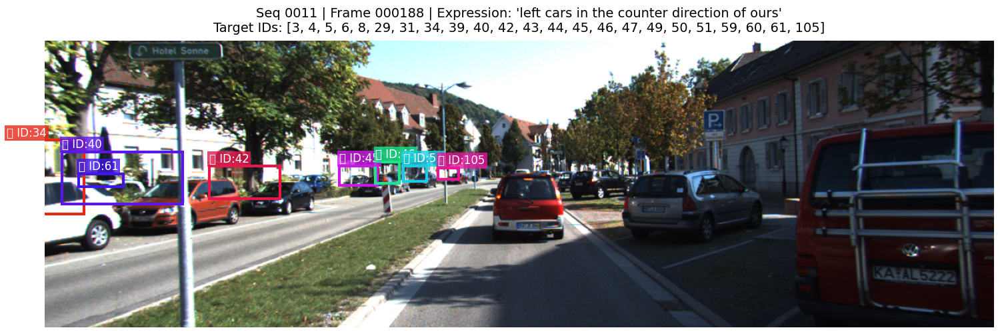


Sample 4/10
Sequence: 0001
Expression: 'right vehicles in black'
Target Object IDs: [9, 11, 36, 38, 39, 41, 45, 54, 57, 58, 59, 84, 85]
JSON file: dataset/referkitti/expression/0001/right-vehicles-in-black.json


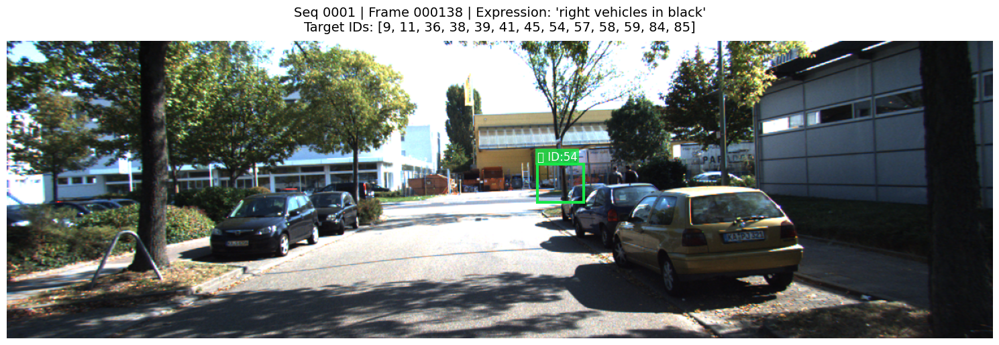


Sample 5/10
Sequence: 0006
Expression: 'red turning vehicles'
Target Object IDs: [2, 6, 21]
JSON file: dataset/referkitti/expression/0006/red-turning-vehicles.json


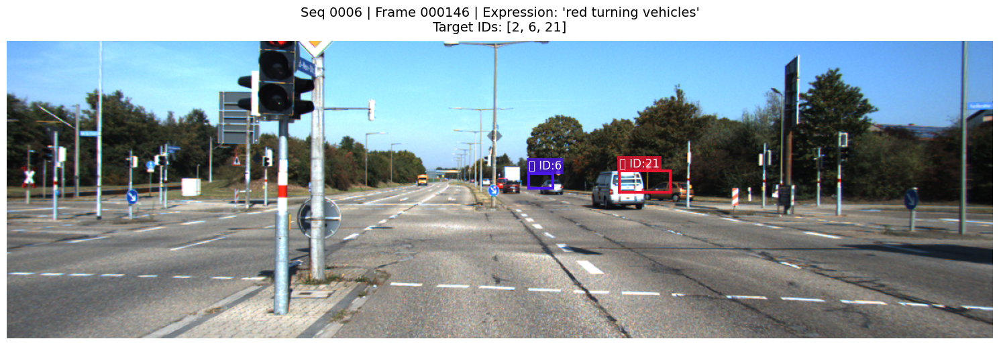


Sample 6/10
Sequence: 0004
Expression: 'silver cars in the left'
Target Object IDs: [2, 12, 22, 23, 25, 33, 35]
JSON file: dataset/referkitti/expression/0004/silver-cars-in-the-left.json


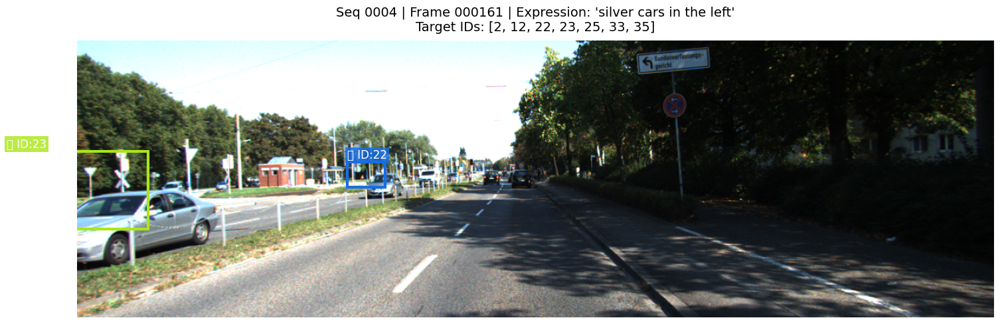


Sample 7/10
Sequence: 0008
Expression: 'counter direction cars in the left'
Target Object IDs: [1, 2, 4, 6, 8, 11, 21, 22, 23, 24, 29, 35, 36, 37, 38]
JSON file: dataset/referkitti/expression/0008/counter-direction-cars-in-the-left.json


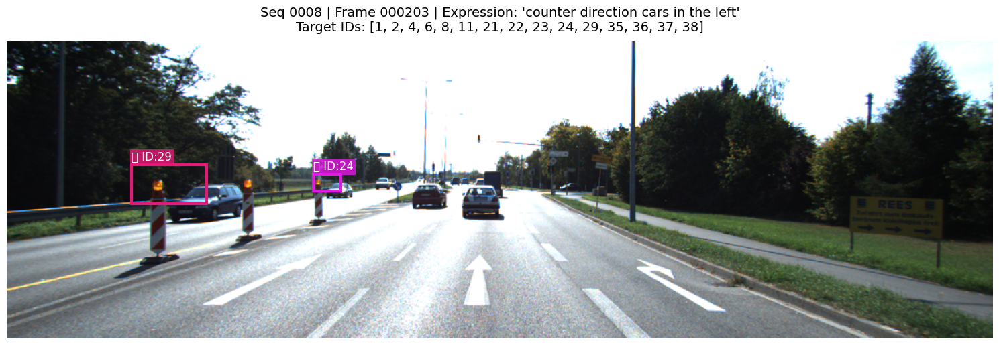


Sample 8/10
Sequence: 0002
Expression: 'black vehicles in the left'
Target Object IDs: [3, 7, 13, 23, 98]
JSON file: dataset/referkitti/expression/0002/black-vehicles-in-the-left.json


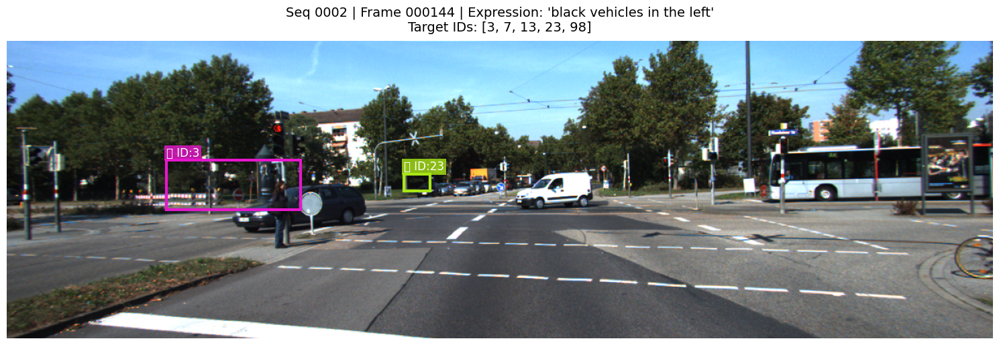


Sample 9/10
Sequence: 0007
Expression: 'silver vehicles in right'
Target Object IDs: [9, 12, 27]
JSON file: dataset/referkitti/expression/0007/silver-vehicles-in-right.json


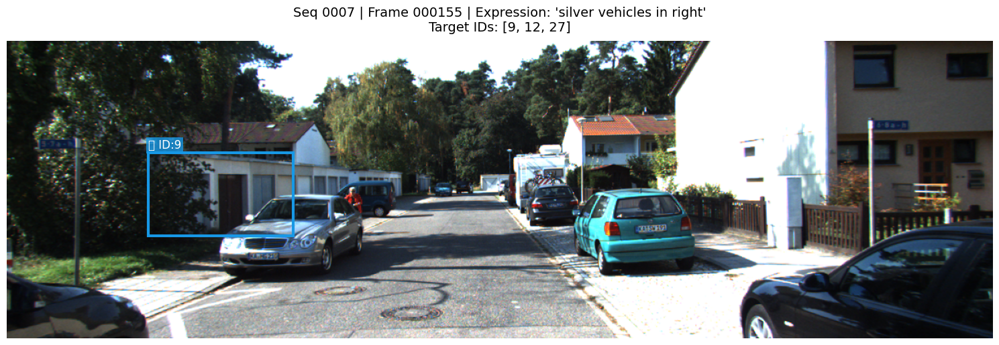


Sample 10/10
Sequence: 0009
Expression: 'counter direction vehicles in the left'
Target Object IDs: [4, 7, 11, 20, 22, 23, 24, 30, 35, 36, 39, 42, 44, 47, 49, 55, 56, 64, 69, 74, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 90, 93, 94, 95, 98, 111]
JSON file: dataset/referkitti/expression/0009/counter-direction-vehicles-in-the-left.json


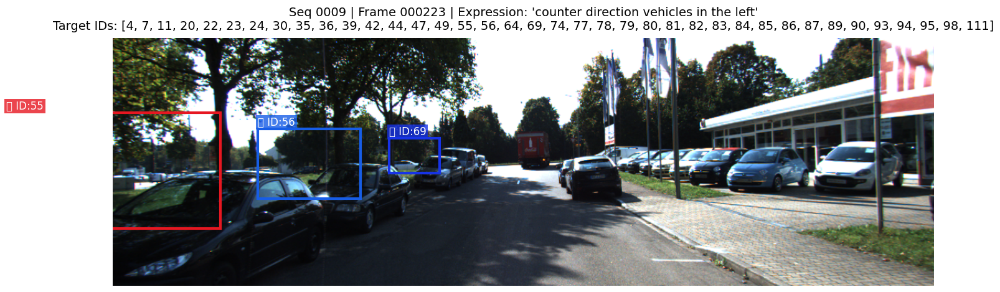

In [30]:
# For each sampled expression, visualize a frame with the target objects highlighted
for i, expr in enumerate(sampled_expressions):
    seq = expr["seq"]
    text = expr["text"]
    obj_ids = expr["obj_ids"]
    label_map = expr.get("label_map", {})
    
    print(f"\n{'='*80}")
    print(f"Sample {i+1}/{num_to_sample}")
    print(f"Sequence: {seq}")
    print(f"Expression: '{text}'")
    print(f"Target Object IDs: {obj_ids}")
    print(f"JSON file: {expr['json_file']}")
    print(f"{'='*80}")
    
    # Find a frame where the target objects appear
    # Use the label_map to find frames with target objects
    frame_ids_with_targets = []
    for frame_str, ids in label_map.items():
        frame_id = int(frame_str)
        frame_ids_with_targets.append(frame_id)
    
    if not frame_ids_with_targets:
        # If label_map is empty, try to find frames with the target IDs
        seq_labels_dir = os.path.join(LABELS_ROOT, seq)
        if os.path.isdir(seq_labels_dir):
            label_files = sorted([f for f in os.listdir(seq_labels_dir) if f.endswith('.txt')])
            for label_file in label_files[:50]:  # Check first 50 frames
                try:
                    frame_id = int(os.path.splitext(label_file)[0])
                    labels = load_frame_labels(LABELS_ROOT, seq, frame_id)
                    track_ids = [l['track_id'] for l in labels]
                    if any(tid in obj_ids for tid in track_ids):
                        frame_ids_with_targets.append(frame_id)
                except ValueError:
                    continue
    
    if frame_ids_with_targets:
        # Pick a random frame or the middle one
        selected_frame = frame_ids_with_targets[len(frame_ids_with_targets) // 2]
        
        title = f"Seq {seq} | Frame {selected_frame:06d} | Expression: '{text}'\nTarget IDs: {obj_ids}"
        visualize_frame_with_gt(
            IMAGES_ROOT, LABELS_ROOT, seq, selected_frame,
            target_ids=set(obj_ids),
            title=title
        )
    else:
        print(f"  ⚠ Could not find frames with target objects for this expression.")

## Part 2: Load Model and Compare Predictions vs Ground Truth

In [15]:
# Import Worker from eval module
sys.path.insert(0, os.path.join(os.getcwd(), 'eval'))
from worker import Worker

import torch
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

/isis/home/hasana3/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


CUDA available: True
CUDA device: NVIDIA RTX 6000 Ada Generation


In [16]:
# Model configuration
MODEL_CONFIG = {
    "tracker_type": "bytetrack",  # Options: bytetrack, clip, smartclip
    "detector": "dino",  # Options: dino, florence2
    "config_path": "groundingdino/config/GroundingDINO_SwinB_cfg.py",
    "weights_path": "weights/swinb_light_visdrone_ft_best.pth",  # Update if needed
    "box_thresh": 0.40,
    "text_thresh": 0.80,
    "track_thresh": 0.45,
    "match_thresh": 0.85,
    "track_buffer": 120,
    "min_box_area": 10,
    "frame_rate": 10,
    "device": "cuda:0" if torch.cuda.is_available() else "cpu",
    "use_fp16": True,
    "referring_mode": "topk",
    "referring_topk": 3,
}

print("Model configuration:")
for k, v in MODEL_CONFIG.items():
    print(f"  {k}: {v}")

Model configuration:
  tracker_type: bytetrack
  detector: dino
  config_path: groundingdino/config/GroundingDINO_SwinB_cfg.py
  weights_path: weights/swinb_light_visdrone_ft_best.pth
  box_thresh: 0.4
  text_thresh: 0.8
  track_thresh: 0.45
  match_thresh: 0.85
  track_buffer: 120
  min_box_area: 10
  frame_rate: 10
  device: cuda:0
  use_fp16: True
  referring_mode: topk
  referring_topk: 3


In [17]:
# Helper function to run inference on a single frame
def run_inference_on_frame(worker, img_path):
    """
    Run GroundingDINO detection on a single frame.
    Returns detections in format: [[x1, y1, x2, y2, score], ...]
    """
    from PIL import Image
    import torch
    import numpy as np
    from groundingdino.util.inference import load_model, predict
    import groundingdino.datasets.transforms as T
    
    # Load and preprocess image (IMPORTANT: predict() expects a tensor, not PIL Image!)
    image_pil = Image.open(img_path).convert("RGB")
    
    # Apply the same transforms as in inference.py load_image()
    transform = T.Compose([
        T.RandomResize([800], max_size=1333),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
    
    image_np = np.asarray(image_pil)
    image_tensor, _ = transform(image_pil, None)
    
    # Load model if not already loaded
    if not hasattr(worker, 'model') or worker.model is None:
        worker.model = load_model(MODEL_CONFIG["config_path"], MODEL_CONFIG["weights_path"])
        if hasattr(worker.model, "to"):
            worker.model = worker.model.to(worker.device)

    # Run detection - PASS THE TENSOR, NOT THE PIL IMAGE!
    boxes, logits, phrases = predict(
        model=worker.model,
        image=image_tensor,  # ← This must be a tensor!
        caption=worker.text_prompt,
        box_threshold=worker.box_thresh,
        text_threshold=worker.text_thresh,
        device=worker.device
    )
    
    # Convert to numpy array with pixel coordinates
    # Get ORIGINAL image size (before transforms)
    W, H = image_pil.size
    detections = []
    for box, logit in zip(boxes, logits):
        cx, cy, w, h = box
        x1 = (cx - w / 2.0) * W
        y1 = (cy - h / 2.0) * H
        x2 = (cx + w / 2.0) * W
        y2 = (cy + h / 2.0) * H
        score = float(logit)
        detections.append([x1, y1, x2, y2, score])
    
    return np.array(detections) if detections else np.empty((0, 5))


def visualize_prediction_vs_gt(img_path, gt_labels, predictions, target_ids, title=""):
    """
    Visualize predictions vs ground truth side by side.
    
    Args:
        img_path: Path to image
        gt_labels: List of GT label dicts (from load_frame_labels)
        predictions: Numpy array of predictions [[x1,y1,x2,y2,score], ...]
        target_ids: Set of target track IDs to highlight
        title: Plot title
    """
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    
    # Create side-by-side plot
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # --- Left: Ground Truth ---
    ax = axes[0]
    ax.imshow(img)
    
    for label in gt_labels:
        track_id = label["track_id"]
        
        # Convert normalized to pixel coordinates
        x_c = label["x_center"] * W
        y_c = label["y_center"] * H
        bw = label["width"] * W
        bh = label["height"] * H
        
        x1 = x_c - bw / 2.0
        y1 = y_c - bh / 2.0
        
        # Highlight target IDs
        is_target = track_id in target_ids
        color = 'lime' if is_target else 'red'
        linewidth = 3 if is_target else 2
        
        rect = patches.Rectangle(
            (x1, y1), bw, bh,
            linewidth=linewidth,
            edgecolor=color,
            facecolor='none'
        )
        ax.add_patch(rect)
        
        label_text = f"ID:{track_id}"
        if is_target:
            label_text = f"⭐ {label_text}"
        
        ax.text(
            x1, y1 - 5,
            label_text,
            color='white',
            fontsize=10,
            bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
        )
    
    ax.set_title("Ground Truth", fontsize=14, fontweight='bold')
    ax.axis('off')
    
    # --- Right: Predictions ---
    ax = axes[1]
    ax.imshow(img)
    
    for i, det in enumerate(predictions):
        x1, y1, x2, y2, score = det
        bw = x2 - x1
        bh = y2 - y1
        
        # Color by confidence
        color = 'blue'
        
        rect = patches.Rectangle(
            (x1, y1), bw, bh,
            linewidth=2,
            edgecolor=color,
            facecolor='none'
        )
        ax.add_patch(rect)
        
        ax.text(
            x1, y1 - 5,
            f"{score:.2f}",
            color='white',
            fontsize=10,
            bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
        )
    
    ax.set_title(f"Predictions ({len(predictions)} detections)", fontsize=14, fontweight='bold')
    ax.axis('off')
    
    if title:
        fig.suptitle(title, fontsize=16, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    plt.show()

print("Inference helper functions loaded!")

Inference helper functions loaded!


## Run Model Predictions on Sampled Expressions

In [ ]:
# Inspect label_map structure for an expression
if sampled_expressions:
    inspect_expr = sampled_expressions[0]
    
    print(f"Expression: '{inspect_expr['text']}'")
    print(f"Sequence: {inspect_expr['seq']}")
    print(f"JSON file: {inspect_expr['json_file']}")
    print(f"\nTarget Object IDs (overall): {inspect_expr['obj_ids']}")
    
    label_map = inspect_expr.get('label_map', {})
    
    if label_map:
        print(f"\nlabel_map structure (frame → target IDs in that frame):")
        print("=" * 80)
        
        # Show first 10 and last 10 frame mappings
        frame_items = sorted([(int(f), ids) for f, ids in label_map.items()])
        
        print(f"{'Frame':<10} {'Target IDs in this frame':<30} {'Note'}")
        print("-" * 80)
        
        # Show first 10
        for frame_id, ids in frame_items[:10]:
            ids_list = ids if isinstance(ids, list) else [ids]
            print(f"{frame_id:<10} {str(ids_list):<30}")
        
        if len(frame_items) > 20:
            print(f"  ...      ({len(frame_items) - 20} frames omitted)")
        
        # Show last 10
        if len(frame_items) > 10:
            for frame_id, ids in frame_items[-10:]:
                ids_list = ids if isinstance(ids, list) else [ids]
                print(f"{frame_id:<10} {str(ids_list):<30}")
        
        print("=" * 80)
        
        # Analyze the mapping
        all_mapped_ids = set()
        for ids in label_map.values():
            if isinstance(ids, list):
                all_mapped_ids.update(ids)
            else:
                all_mapped_ids.add(ids)
        
        print(f"\nAnalysis:")
        print(f"  - Total frames with targets: {len(label_map)}")
        print(f"  - Frame range: {min(frame_items)[0]:06d} to {max(frame_items)[0]:06d}")
        print(f"  - Unique target IDs appearing: {sorted(all_mapped_ids)}")
        print(f"  - Match with obj_ids: {all_mapped_ids == set(inspect_expr['obj_ids'])}")
        
        # Check if different targets appear in different frames
        id_to_frames = {}
        for frame_id, ids in frame_items:
            ids_list = ids if isinstance(ids, list) else [ids]
            for tid in ids_list:
                if tid not in id_to_frames:
                    id_to_frames[tid] = []
                id_to_frames[tid].append(frame_id)
        
        print(f"\n  Target ID appearances:")
        for tid in sorted(id_to_frames.keys()):
            frames = id_to_frames[tid]
            print(f"    ID {tid}: appears in {len(frames)} frames (frames {min(frames):06d} to {max(frames):06d})")
    else:
        print(f"\n⚠ No label_map found in expression JSON")
        print(f"   This means we don't know which specific frames contain the targets.")
        print(f"   Will need to search through all frames to find target IDs.")
else:
    print("No expressions to inspect")

## 🔍 Understanding label_map: Frame-specific Target IDs

The `label_map` in the expression JSON tells us which target objects appear in which frames:

In [ ]:
# Create and display video for a sampled expression
if sampled_expressions:
    # Use the first expression as example
    video_expr = sampled_expressions[0]
    
    print(f"Creating GT video for:")
    print(f"  Expression: '{video_expr['text']}'")
    print(f"  Sequence: {video_expr['seq']}")
    print(f"  Target IDs: {video_expr['obj_ids']}\n")
    
    # Create video (limit to 50 frames for reasonable size)
    video_path = create_gt_video_for_expression(
        video_expr, 
        IMAGES_ROOT, 
        LABELS_ROOT,
        max_frames=50
    )
    
    if video_path:
        print(f"\n📺 Displaying video...")
        
        # Display video in notebook
        display(Video(video_path, width=800, embed=True))
        
        print(f"\n✅ Video file: {video_path}")
        print(f"   You can also open this file externally to verify GT boxes are correctly positioned.")
else:
    print("No expressions available for video creation")

In [ ]:
# Video generation function
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
from IPython.display import Video
import tempfile

def create_gt_video_for_expression(expr, images_root, labels_root, max_frames=50, output_path=None):
    """
    Create a video showing GT boxes (filtered to targets) for an expression.
    
    Args:
        expr: Expression dict with 'seq', 'text', 'obj_ids', 'label_map'
        images_root: Path to images
        labels_root: Path to labels
        max_frames: Maximum number of frames to process
        output_path: Where to save video (if None, uses temp file)
    
    Returns:
        Path to video file
    """
    seq = expr["seq"]
    text = expr["text"]
    target_ids = set(expr["obj_ids"])
    label_map = expr.get("label_map", {})
    
    # Get frame IDs from label_map
    frame_ids = sorted([int(f) for f in label_map.keys()]) if label_map else []
    
    if not frame_ids:
        print(f"⚠ No frames in label_map, searching for frames with target objects...")
        seq_labels_dir = os.path.join(labels_root, seq)
        if os.path.isdir(seq_labels_dir):
            label_files = sorted([f for f in os.listdir(seq_labels_dir) if f.endswith('.txt')])
            for label_file in label_files[:100]:
                try:
                    frame_id = int(os.path.splitext(label_file)[0])
                    labels = load_frame_labels(labels_root, seq, frame_id)
                    track_ids = [l['track_id'] for l in labels]
                    if any(tid in target_ids for tid in track_ids):
                        frame_ids.append(frame_id)
                except ValueError:
                    continue
    
    if not frame_ids:
        print("❌ No frames found!")
        return None
    
    # Limit frames
    frame_ids = frame_ids[:max_frames]
    
    print(f"Creating video for expression: '{text}'")
    print(f"  Sequence: {seq}")
    print(f"  Target IDs: {sorted(target_ids)}")
    print(f"  Frames: {len(frame_ids)} (from {frame_ids[0]:06d} to {frame_ids[-1]:06d})")
    
    # Prepare output path
    if output_path is None:
        output_path = f"referkitti_{seq}_{text.replace(' ', '_')[:30]}.mp4"
    
    # Create frames
    frames = []
    for frame_id in frame_ids:
        # Load image
        img_path_png = os.path.join(images_root, seq, f"{frame_id:06d}.png")
        img_path_jpg = os.path.join(images_root, seq, f"{frame_id:06d}.jpg")
        
        img = cv2.imread(img_path_png)
        if img is None:
            img = cv2.imread(img_path_jpg)
        
        if img is None:
            continue
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]
        
        # Load labels and filter to targets
        all_labels = load_frame_labels(labels_root, seq, frame_id)
        target_labels = [l for l in all_labels if l["track_id"] in target_ids]
        
        # Draw on image
        img_draw = img_rgb.copy()
        for label in target_labels:
            track_id = label["track_id"]
            x_c = label["x_center"] * W
            y_c = label["y_center"] * H
            bw = label["width"] * W
            bh = label["height"] * H
            
            x1 = int(x_c - bw / 2.0)
            y1 = int(y_c - bh / 2.0)
            x2 = int(x1 + bw)
            y2 = int(y1 + bh)
            
            # Get color
            color_rgb = get_color_for_id(track_id)
            color_bgr = tuple([int(c * 255) for c in reversed(color_rgb)])
            
            # Draw box
            cv2.rectangle(img_draw, (x1, y1), (x2, y2), color_bgr, 3)
            
            # Draw label
            label_text = f"ID:{track_id}"
            (tw, th), _ = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            cv2.rectangle(img_draw, (x1, y1-th-8), (x1+tw+8, y1), color_bgr, -1)
            cv2.putText(img_draw, label_text, (x1+4, y1-4), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
        
        # Add text overlay
        overlay_text = f"Frame {frame_id:06d} | {text} | Targets: {sorted(target_ids)}"
        cv2.rectangle(img_draw, (10, 10), (W-10, 50), (0, 0, 0), -1)
        cv2.putText(img_draw, overlay_text, (20, 35), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        
        frames.append(img_draw)
    
    if not frames:
        print("❌ No frames were created!")
        return None
    
    # Save video using opencv
    height, width = frames[0].shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(output_path, fourcc, 10, (width, height))
    
    for frame in frames:
        # Convert RGB to BGR for opencv
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        video_writer.write(frame_bgr)
    
    video_writer.release()
    
    print(f"✅ Video saved to: {output_path}")
    print(f"   {len(frames)} frames, size: {width}×{height}")
    
    return output_path


print("Video generation function loaded!")

## 🎬 Video Visualization: GT + Predictions Over Time

Create a video showing GT (filtered to targets) and predictions side-by-side for a complete expression.

Will run predictions on 5 expressions

Prediction 1/5
Sequence: 0011
Expression: 'pedestrian who are walking'
Target Object IDs: [53, 117]

📦 Loading model with expression: 'pedestrian who are walking'...


final text_encoder_type: bert-base-uncased
[Worker] Referring filter enabled: mode=topk, topk=3, thresh=0.0

🔍 Running detection on frame 000028...
final text_encoder_type: bert-base-uncased


   Found 2 detections


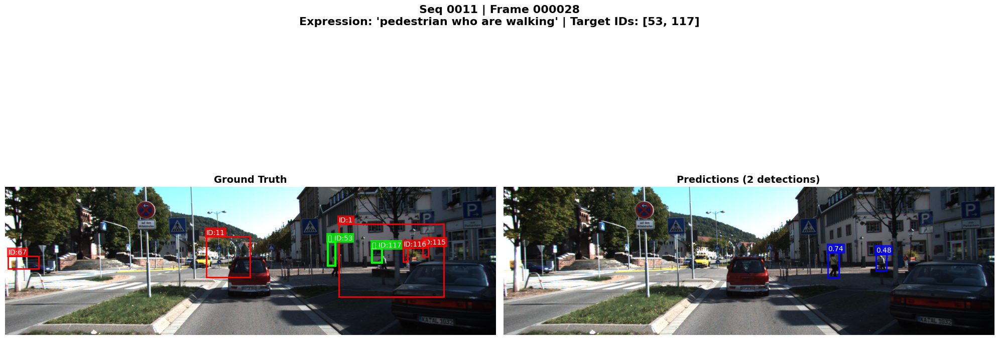


Prediction 2/5
Sequence: 0001
Expression: 'light-color cars in the right'
Target Object IDs: [8, 44, 62, 63, 65, 69, 70, 71, 78, 80, 86, 92]

📦 Loading model with expression: 'light-color cars in the right'...
final text_encoder_type: bert-base-uncased
[Worker] Referring filter enabled: mode=topk, topk=3, thresh=0.0

🔍 Running detection on frame 000260...
final text_encoder_type: bert-base-uncased
   Found 1 detections


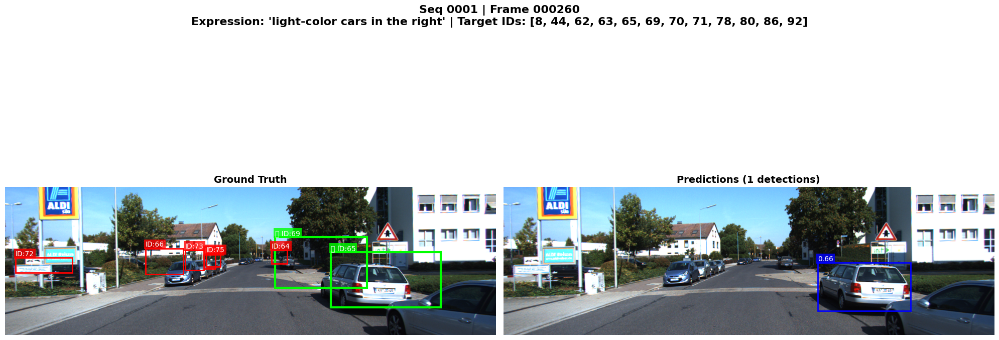


Prediction 3/5
Sequence: 0008
Expression: 'cars in light color'
Target Object IDs: [6, 8, 20, 23, 25, 35]

📦 Loading model with expression: 'cars in light color'...
final text_encoder_type: bert-base-uncased
[Worker] Referring filter enabled: mode=topk, topk=3, thresh=0.0

🔍 Running detection on frame 000194...
final text_encoder_type: bert-base-uncased
   Found 3 detections


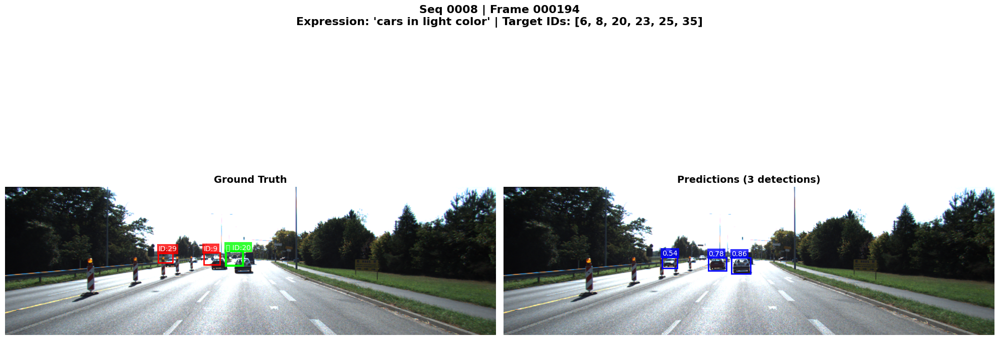


Prediction 4/5
Sequence: 0002
Expression: 'cars in silver'
Target Object IDs: [1, 6, 11, 25]

📦 Loading model with expression: 'cars in silver'...
final text_encoder_type: bert-base-uncased
[Worker] Referring filter enabled: mode=topk, topk=3, thresh=0.0

🔍 Running detection on frame 000117...
final text_encoder_type: bert-base-uncased
   Found 5 detections


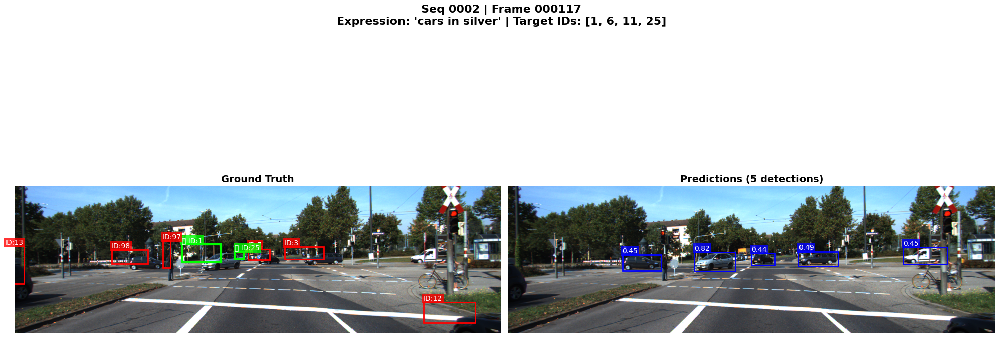


Prediction 5/5
Sequence: 0013
Expression: 'standing females'
Target Object IDs: [53, 97, 110, 115, 116, 124, 125, 129, 130, 144]

📦 Loading model with expression: 'standing females'...
final text_encoder_type: bert-base-uncased
[Worker] Referring filter enabled: mode=topk, topk=3, thresh=0.0

🔍 Running detection on frame 000213...
final text_encoder_type: bert-base-uncased
   Found 1 detections


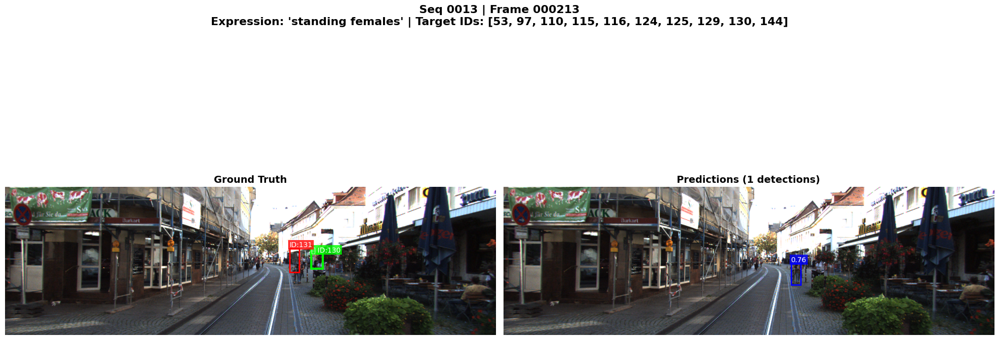


✅ Prediction visualization complete!


In [18]:
# Process a subset of sampled expressions (to avoid long runtime)
num_to_predict = min(5, len(sampled_expressions))
expressions_to_predict = sampled_expressions[:num_to_predict]

print(f"Will run predictions on {num_to_predict} expressions")

for i, expr in enumerate(expressions_to_predict):
    seq = expr["seq"]
    text = expr["text"]
    obj_ids = expr["obj_ids"]
    label_map = expr.get("label_map", {})
    
    print(f"\n{'='*80}")
    print(f"Prediction {i+1}/{num_to_predict}")
    print(f"Sequence: {seq}")
    print(f"Expression: '{text}'")
    print(f"Target Object IDs: {obj_ids}")
    print(f"{'='*80}")
    
    # Initialize worker with this expression
    print(f"\n📦 Loading model with expression: '{text}'...")
    worker = Worker(
        tracker_type=MODEL_CONFIG["tracker_type"],
        detector=MODEL_CONFIG["detector"],
        config_path=MODEL_CONFIG["config_path"],
        weights_path=MODEL_CONFIG["weights_path"],
        box_thresh=MODEL_CONFIG["box_thresh"],
        text_thresh=MODEL_CONFIG["text_thresh"],
        text_prompt=text,  # Use the referring expression
        device=MODEL_CONFIG["device"],
        use_fp16=MODEL_CONFIG["use_fp16"],
        tracker_kwargs={
            "track_thresh": MODEL_CONFIG["track_thresh"],
            "match_thresh": MODEL_CONFIG["match_thresh"],
            "track_buffer": MODEL_CONFIG["track_buffer"],
        },
        min_box_area=MODEL_CONFIG["min_box_area"],
        frame_rate=MODEL_CONFIG["frame_rate"],
        referring_mode=MODEL_CONFIG["referring_mode"],
        referring_topk=MODEL_CONFIG["referring_topk"],
    )
    
    # Find a frame with target objects
    frame_ids_with_targets = [int(f) for f in label_map.keys()] if label_map else []
    
    if not frame_ids_with_targets:
        # Fallback: search for frames
        seq_labels_dir = os.path.join(LABELS_ROOT, seq)
        if os.path.isdir(seq_labels_dir):
            label_files = sorted([f for f in os.listdir(seq_labels_dir) if f.endswith('.txt')])
            for label_file in label_files[:50]:
                try:
                    frame_id = int(os.path.splitext(label_file)[0])
                    labels = load_frame_labels(LABELS_ROOT, seq, frame_id)
                    track_ids = [l['track_id'] for l in labels]
                    if any(tid in obj_ids for tid in track_ids):
                        frame_ids_with_targets.append(frame_id)
                except ValueError:
                    continue
    
    if not frame_ids_with_targets:
        print("  ⚠ No frames with target objects found")
        continue
    
    # Pick middle frame
    selected_frame = frame_ids_with_targets[len(frame_ids_with_targets) // 2]
    
    # Build image path
    img_path_png = os.path.join(IMAGES_ROOT, seq, f"{selected_frame:06d}.png")
    img_path_jpg = os.path.join(IMAGES_ROOT, seq, f"{selected_frame:06d}.jpg")
    img_path = img_path_png if os.path.exists(img_path_png) else img_path_jpg
    
    if not os.path.exists(img_path):
        print(f"  ⚠ Image not found: {img_path}")
        continue
    
    # Run inference
    print(f"\n🔍 Running detection on frame {selected_frame:06d}...")
    predictions = run_inference_on_frame(worker, img_path)
    print(f"   Found {len(predictions)} detections")
    
    # Load GT for this frame
    gt_labels = load_frame_labels(LABELS_ROOT, seq, selected_frame)
    
    # Visualize
    title = f"Seq {seq} | Frame {selected_frame:06d}\nExpression: '{text}' | Target IDs: {obj_ids}"
    visualize_prediction_vs_gt(
        img_path,
        gt_labels,
        predictions,
        set(obj_ids),
        title=title
    )

print("\n✅ Prediction visualization complete!")

## Summary Statistics

In [ ]:
# Print summary statistics about the dataset
print("Dataset Summary:")
print(f"  Total sequences: {len(all_seqs)}")
print(f"  Total expressions: {len(all_expressions)}")

# Count expressions per sequence
expr_per_seq = {}
for expr in all_expressions:
    seq = expr['seq']
    expr_per_seq[seq] = expr_per_seq.get(seq, 0) + 1

print(f"\n  Expressions per sequence:")
for seq in sorted(expr_per_seq.keys())[:10]:
    print(f"    {seq}: {expr_per_seq[seq]}")

# Count unique target IDs
all_target_ids = set()
for expr in all_expressions:
    all_target_ids.update(expr['obj_ids'])

print(f"\n  Unique target object IDs: {len(all_target_ids)}")
print(f"  Average target IDs per expression: {np.mean([len(e['obj_ids']) for e in all_expressions]):.2f}")